In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt

import json
import enum
import os

from col_mnist import ColMNIST
from three_d_shapes_ds import ThreeDShapes
from models import compute_layer_blocks_out, compute_layer_blocks_in


class SupportedDatasets(enum.Enum):
    THREEDSHAPES = 0,
    COL_MNIST = 1,
    CIFAR10 = 2

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [3]:
#MODEL_DIR = "outputs/30.11.2021(12:05:53)"
#MODEL_DIR = "outputs/29.11.2021(20:08:38)"
#MODEL_DIR = "outputs/03.12.2021(11:05:35)/"
MODEL_DIR = "outputs/08.12.2021(17:46:41)"

vgg16 = torch.load(os.path.join(MODEL_DIR, "model.pt"))
layer = vgg16.classifier[3]
layer_size = layer.out_features
blocks = compute_layer_blocks_in(layer, vgg16.classifier[2].n_conn_comp)
ncc = max(blocks)+1
ds = SupportedDatasets.THREEDSHAPES
filtered = False

In [4]:
ncc = 6
blocks = compute_layer_blocks_in(layer, ncc)

In [5]:
# for i in range(1, ncc+1):
#     blocks = compute_layer_blocks_out(layer, i)
#     print(max(blocks))

In [6]:
if not os.path.exists(os.path.join(MODEL_DIR, "visualizations")):
    os.mkdir(os.path.join(MODEL_DIR, "visualizations"))
ds = SupportedDatasets.THREEDSHAPES

In [7]:
if ds == SupportedDatasets.THREEDSHAPES:
    trainloader = torch.utils.data.DataLoader(
                                          ThreeDShapes(filename='data/3dshapes.h5',
                                                       transform=torchvision.transforms.Compose([
                                                           torchvision.transforms.ToPILImage(), 
                                                           torchvision.transforms.Resize((32, 32)),
                                                           torchvision.transforms.ToTensor(),
                                          ]), filtered = filtered),
                                          batch_size=32, shuffle=True)
    testloader = torch.utils.data.DataLoader(
                                          ThreeDShapes(filename='data/3dshapes.h5',
                                                       transform=torchvision.transforms.Compose([
                                                           torchvision.transforms.ToPILImage(), 
                                                           torchvision.transforms.Resize((32, 32)),
                                                           torchvision.transforms.ToTensor(),
                                          ]), filtered = filtered),
                                          batch_size=32, shuffle=True)
elif ds == SupportedDatasets.COL_MNIST:
    trainloader = torch.utils.data.DataLoader(
      ColMNIST('data/mnist', train=True, download=True,
                                 transform=torchvision.transforms.Compose([#torchvision.transforms.Resize((224, 224)),
                                   torchvision.transforms.ToTensor(),
                                 ])),
      batch_size=32, shuffle=True)

    testloader = torch.utils.data.DataLoader(
      ColMNIST('data/mnist', train=False, download=True,
                                 transform=torchvision.transforms.Compose([#torchvision.transforms.Resize((224, 224)),
                                   torchvision.transforms.ToTensor()
                                 ])),
      batch_size=32, shuffle=True)

elif ds == SupportedDatasets.CIFAR10:
    transform = transforms.Compose(
        [transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    trainset = torchvision.datasets.CIFAR10(root="./data", train=True,
                                            download=True, transform=transform)
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=32,
                                            shuffle=True)
    testset = torchvision.datasets.CIFAR10(root="./data", train=False,
                                        download=True, transform=transform)
    testloader = torch.utils.data.DataLoader(testset, batch_size=32,
                                            shuffle=False)
    n_classes = 10
    def target_vec_to_class(x):
        return x

<class 'numpy.ndarray'>


/opt/conda/lib/python3.8/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.0.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(


done loading
<class 'numpy.ndarray'>


/opt/conda/lib/python3.8/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.0.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(


done loading


In [8]:
#find activations for images
class SaveOutput:
    def __init__(self):
        self.outputs = None
        
    def __call__(self, module, module_in, module_out):
        self.outputs = module_out.detach().cpu().numpy()

hook = SaveOutput()
layer.register_forward_hook(hook)
act = np.zeros((0, layer_size))

for i, data in enumerate(testloader):
    print(i, end="\r")
    data, (target, labels) = data[0], data[1]
    data = data.cuda()
    output = vgg16(data)
    act = np.concatenate((act, hook.outputs), axis=0)
    if i > 1000:
        break
    
img_shape = data[0].shape
target_shape = target[0].shape

In [9]:
target_shape

torch.Size([6])

In [10]:
thr_low = np.percentile(act, 5, axis=0)
thr_high = np.percentile(act, 95, axis=0)

In [11]:
#%pdb on

In [12]:
#find activations for images
class SaveOutput:
    def __init__(self):
        self.outputs = None
        
    def __call__(self, module, module_in, module_out):
        self.outputs = module_out.detach().cpu().numpy()

hook = SaveOutput()
layer.register_forward_hook(hook)

weighted_images_pos = np.zeros((layer_size, *img_shape))
img_examples_pos = [np.zeros((0, *img_shape)) for _ in range(layer_size)]
weighted_images_neg = np.zeros((layer_size, *img_shape))
targets_pos = [np.zeros((0, *target_shape)) for i in range(layer_size)]
targets_neg = [np.zeros((0, *target_shape)) for i in range(layer_size)]
n_pos = np.zeros((layer_size))
n_neg = np.zeros((layer_size))

for i, data in enumerate(testloader):
    print(i, end="\r")
    if i > 100:
        break
    data, (target, labels) = data[0], data[1]
    data = data.cuda()
    output = vgg16(data)
    data = data.detach().cpu().numpy()

    batch_ext = np.repeat(data[:, np.newaxis, :, :], layer_size, axis=1)
    
    #print(weighted_images_pos.shape)
    #print(batch_ext.shape)
    weighted_images_pos += np.average(batch_ext * np.expand_dims((hook.outputs > thr_high), axis=(2, 3, 4)), axis=0)
    weighted_images_neg += np.average(batch_ext * np.expand_dims((hook.outputs < thr_low), axis=(2, 3, 4)), axis=0)
    #for j in range(layer_size):
    #    print(np.expand_dims((hook.outputs > thr_high), axis=(2, 3, 4)).shape)
    for j in range(32):
        for k in range(layer_size):
            if hook.outputs[j, k].item() > thr_high[k]:
                img_examples_pos[k] = np.concatenate((img_examples_pos[k], data[j][np.newaxis, :,:, :]), axis=0)
    
    img_examples_pos
    n_pos += (hook.outputs > thr_high).sum(axis=0)/32
    n_neg += (hook.outputs < thr_low).sum(axis=0)/32
    
    #targets of images that activated each neuron by more than the threshold
    for j in range(layer_size):
        targets_pos[j] = np.concatenate([targets_pos[j], target[hook.outputs[:,j] > thr_high[j]]], axis=0)
        targets_neg[j] = np.concatenate([targets_neg[j], target[hook.outputs[:,j] < thr_low[j]]], axis=0)


In [13]:
#weighted_images_pos_norm = weighted_images_pos / np.expand_dims(np.max(weighted_images_pos, axis=(1, 2, 3)), axis=(1, 2, 3))
#weighted_images_neg_norm = weighted_images_neg / np.expand_dims(np.max(weighted_images_neg, axis=(1, 2, 3)), axis=(1, 2, 3))
weighted_images_pos_norm = weighted_images_pos/n_pos[:, np.newaxis, np.newaxis, np.newaxis]
weighted_images_neg_norm = weighted_images_neg/n_neg[:, np.newaxis, np.newaxis, np.newaxis]

In [14]:
_FACTORS_IN_ORDER = ['floor_hue', 'wall_hue', 'object_hue', 'scale', 'shape',
                     'orientation']

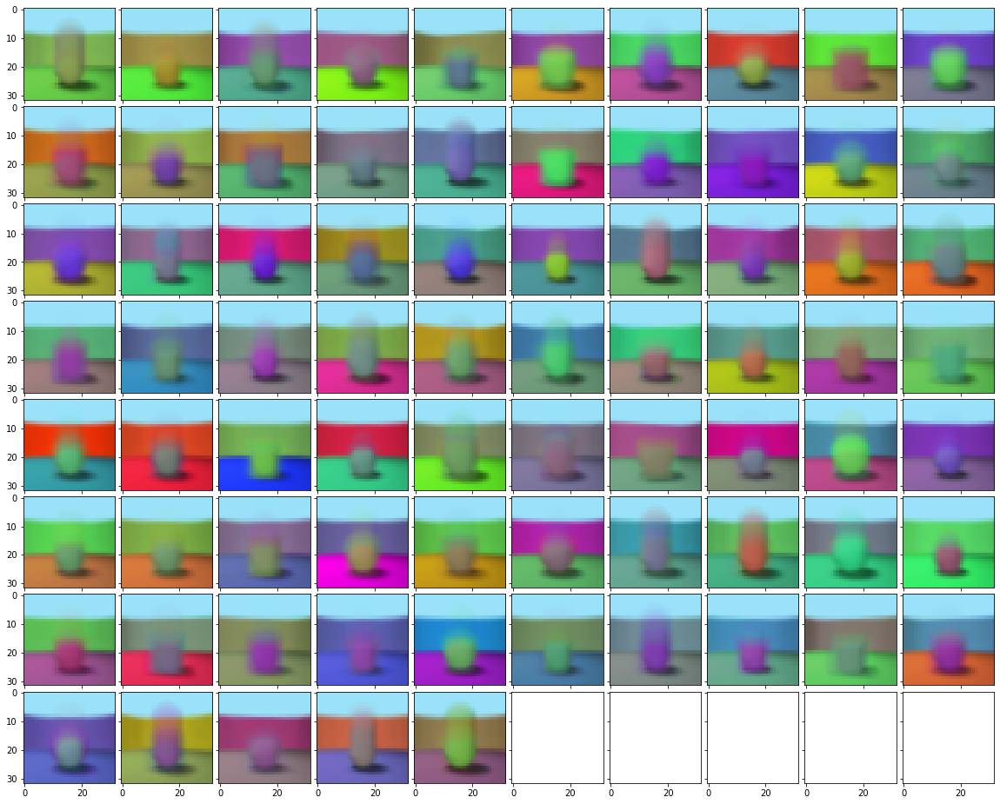

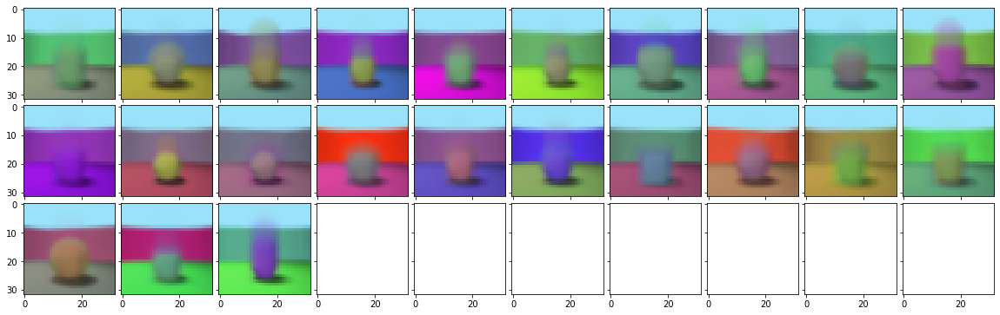

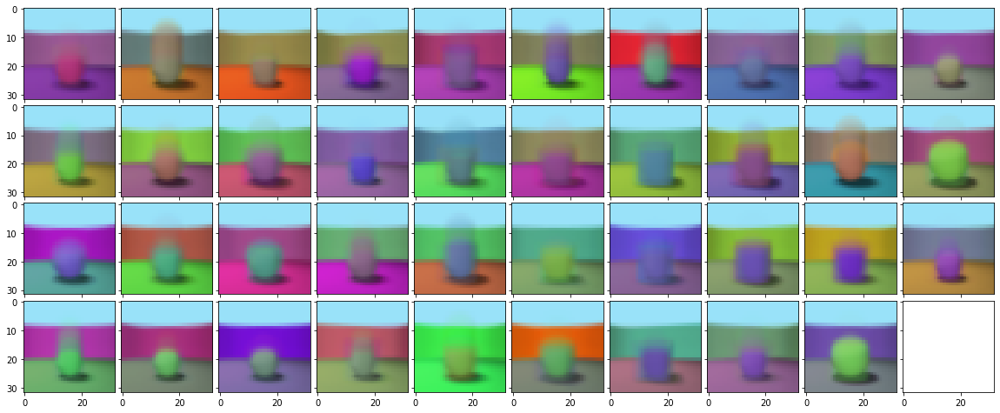

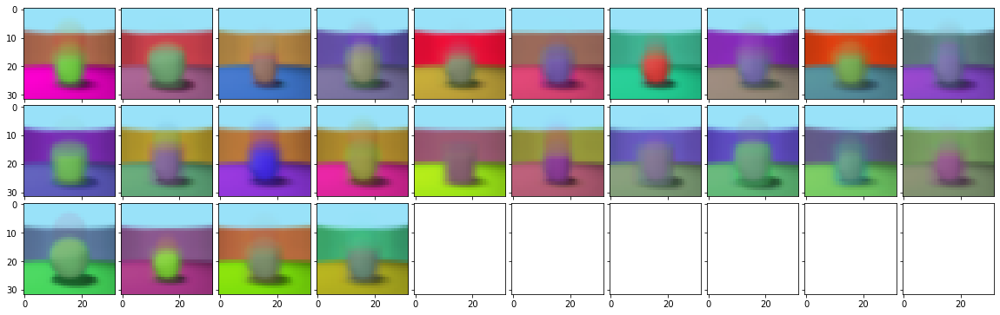

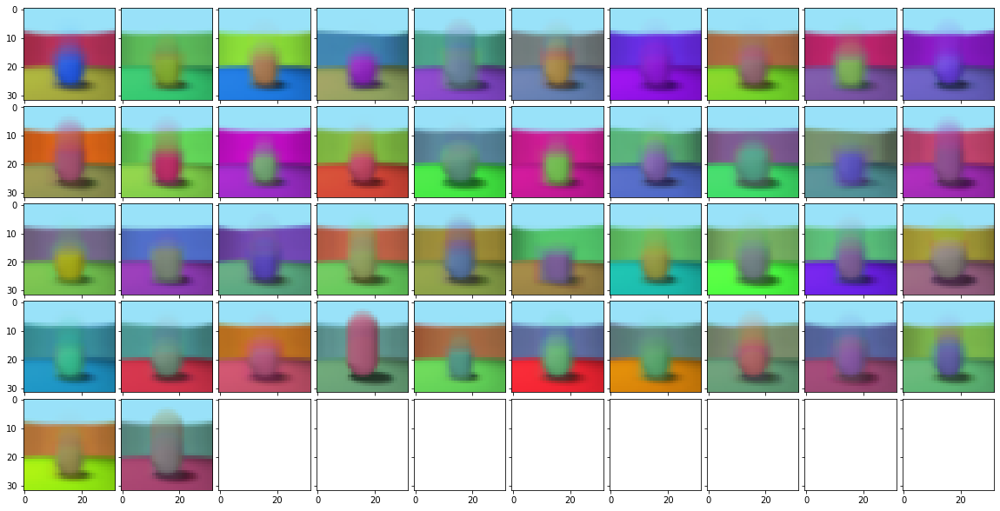

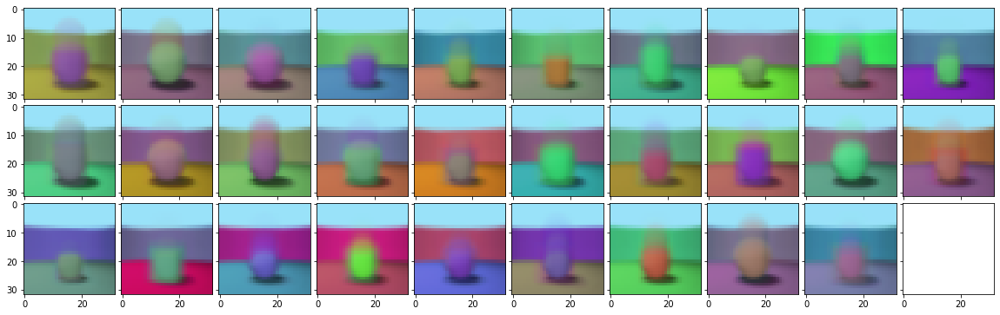

In [15]:
for c in range(ncc):
    if (blocks==c).sum() > 0:
        fig = plt.figure(figsize=(20., 20.))
        grid = ImageGrid(fig, 111,  # similar to subplot(111)
                         nrows_ncols=(int(np.ceil((blocks==c).sum()/10)), 10),  # creates 2x2 grid of axes
                         axes_pad=0.1,  # pad between axes in inch.
                        )

        for ax, im in zip(grid, weighted_images_pos_norm[blocks==c]):
            ax.imshow(im.transpose(1, 2, 0))
        plt.show()
        fig.savefig(os.path.join(MODEL_DIR, "visualizations","block_{}_pos_img_avg.png".format(c)))

floor_hue


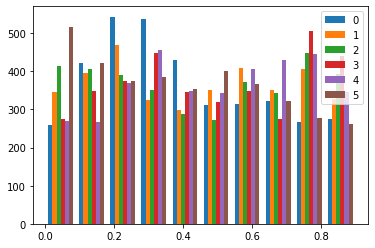

wall_hue


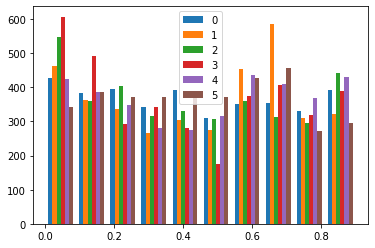

object_hue


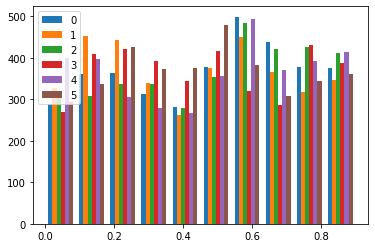

scale


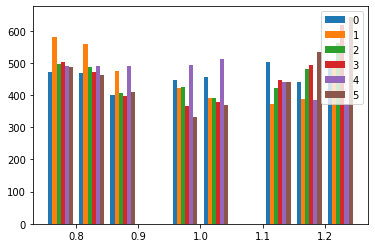

shape


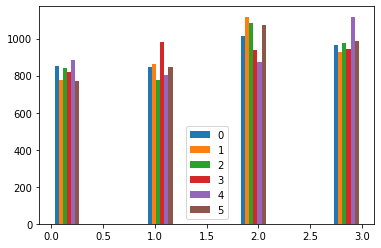

orientation


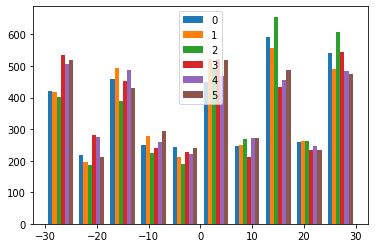

In [16]:
for i in range(6):
    print(_FACTORS_IN_ORDER[i])
    targets_pos_aggregate = list()
    for c in range(ncc):
        #print("Block {}".format(c+1))
        targets_pos_aggregate.append(np.zeros((0)))
        for j in range(layer_size):
            if blocks[j] == c:
                targets_pos_aggregate[c] = np.concatenate([targets_pos_aggregate[c], targets_pos[j][:, i]], axis=0)

    #print(targets_pos_aggregate)
    min_len = min(len(targets_pos_aggregate[c]) for c in range(ncc))
    targets_pos_aggregate_sample = [targets_pos_aggregate[c][:min_len] for c in range(ncc)]
    fig = plt.figure()
    plt.hist(np.array(targets_pos_aggregate_sample).transpose())
    plt.legend(range(ncc))
    plt.show()
    fig.savefig(os.path.join(MODEL_DIR, "visualizations","factor_{}_pos_factors_hist.png".format(i)))

Block 0


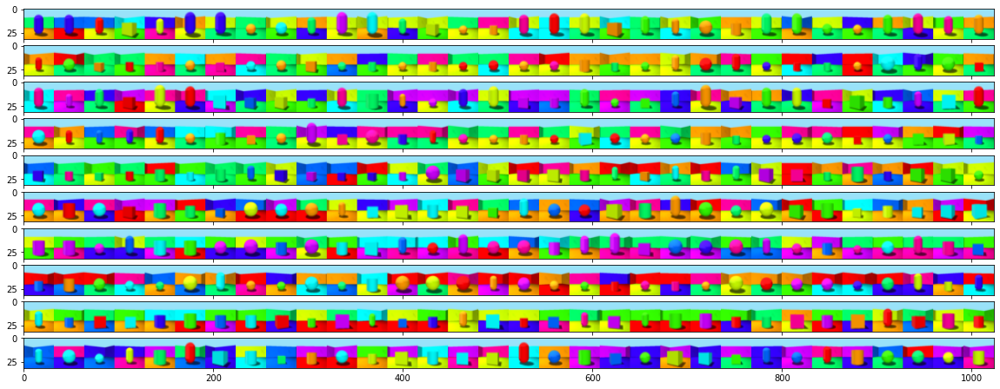

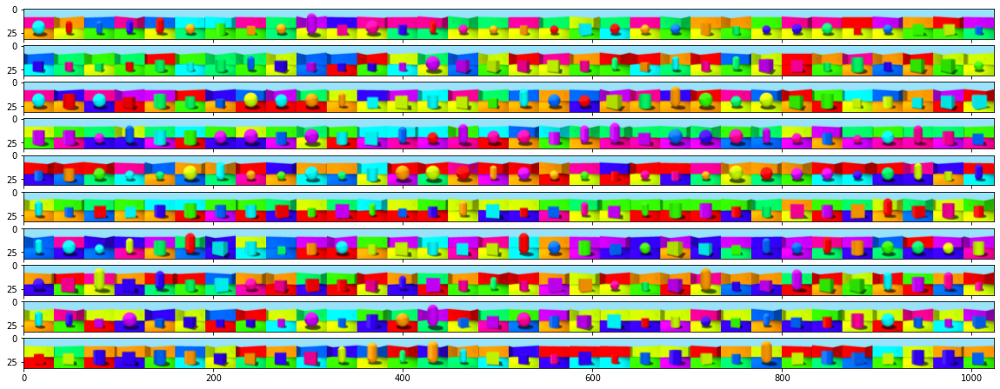

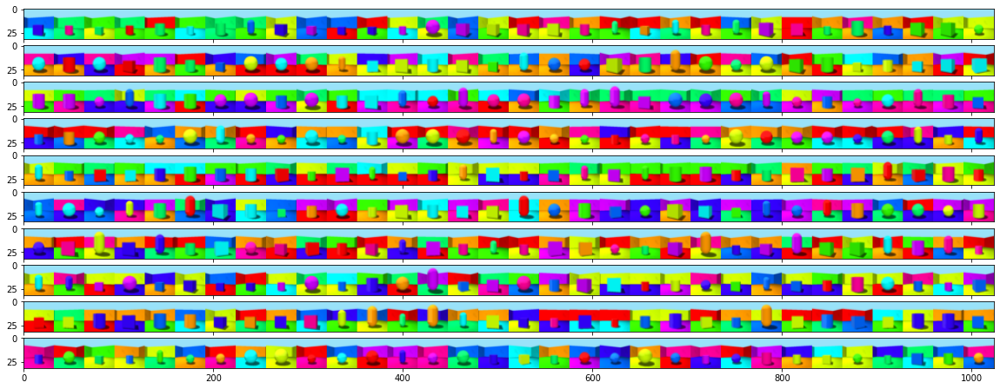

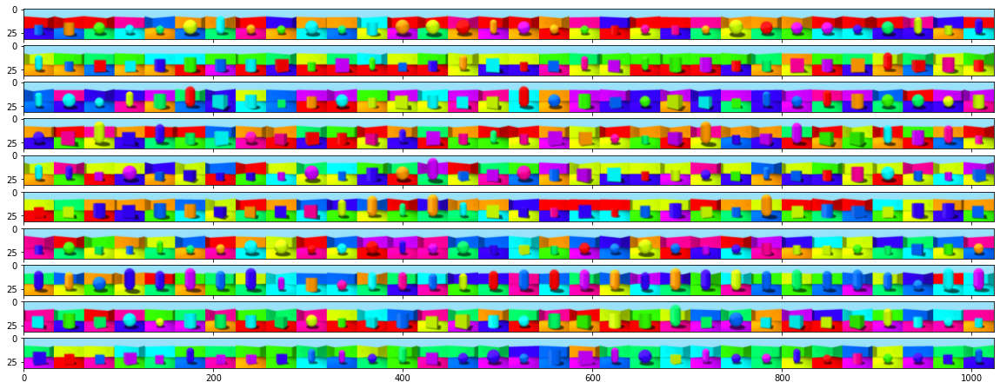

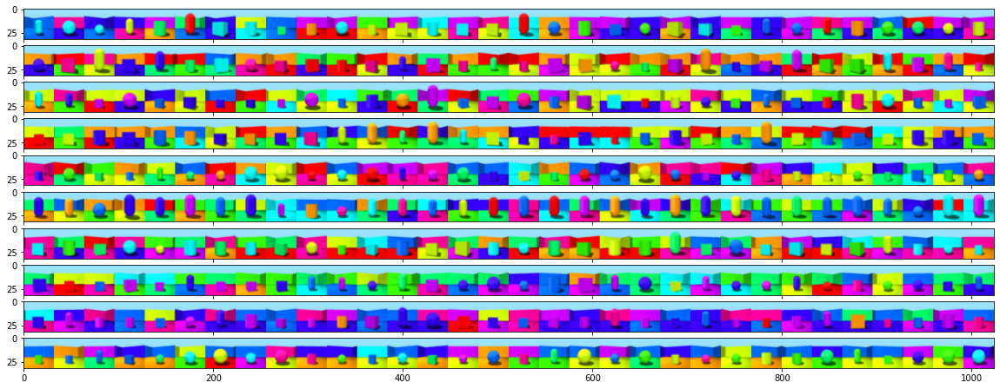

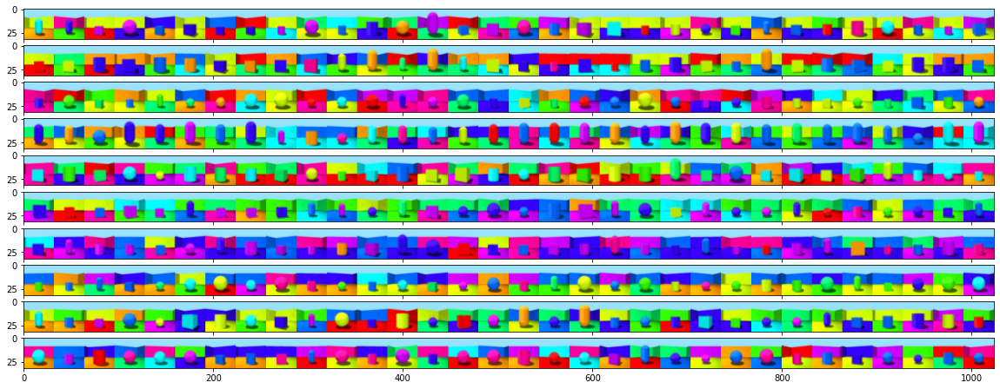

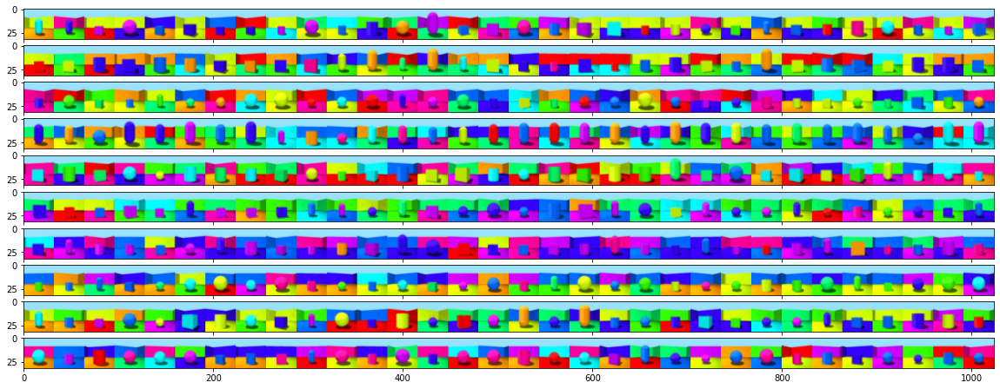

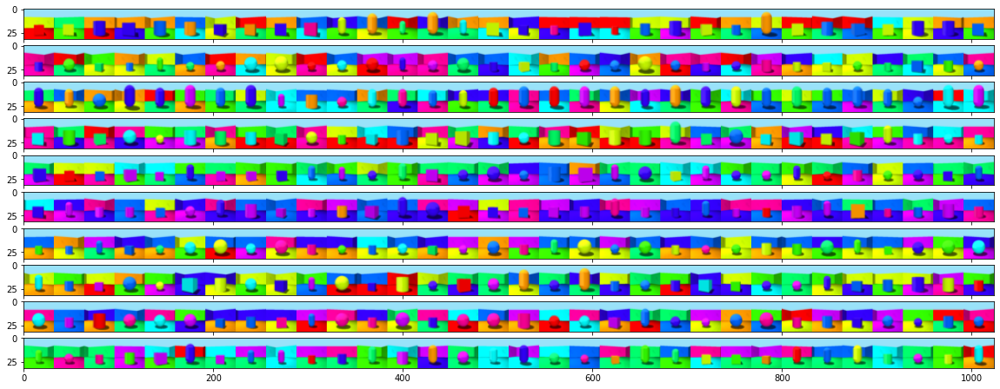

Block 1


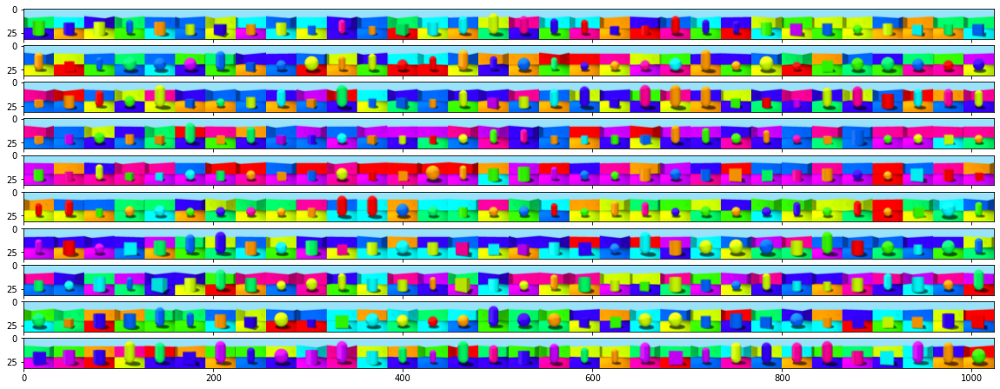

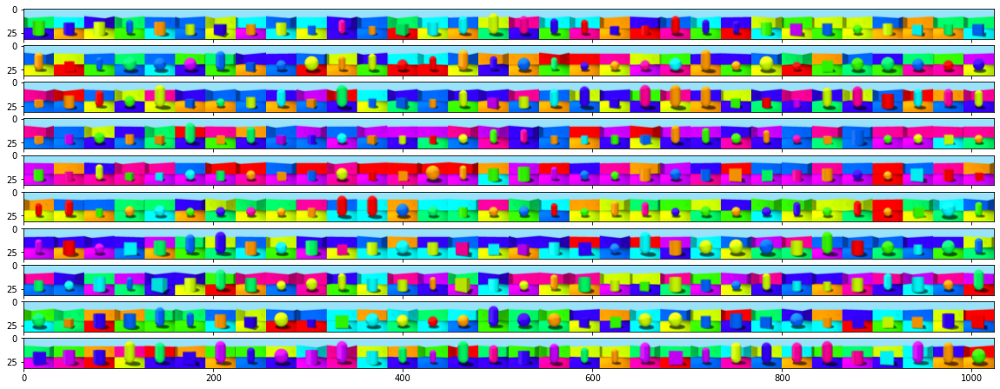

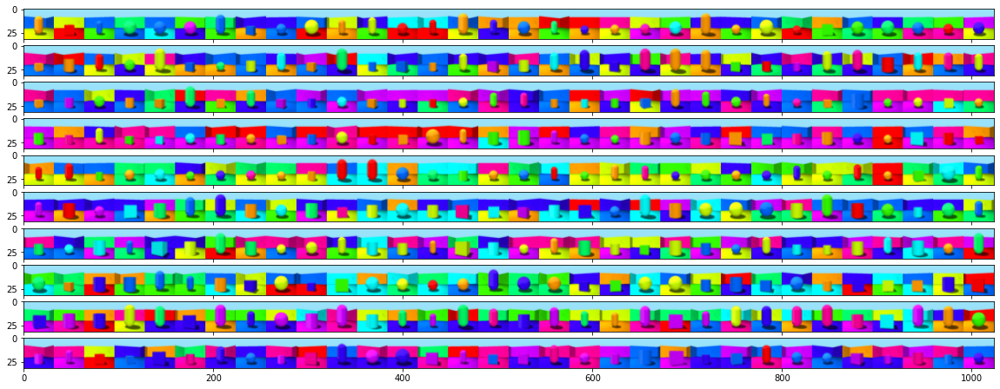

Block 2


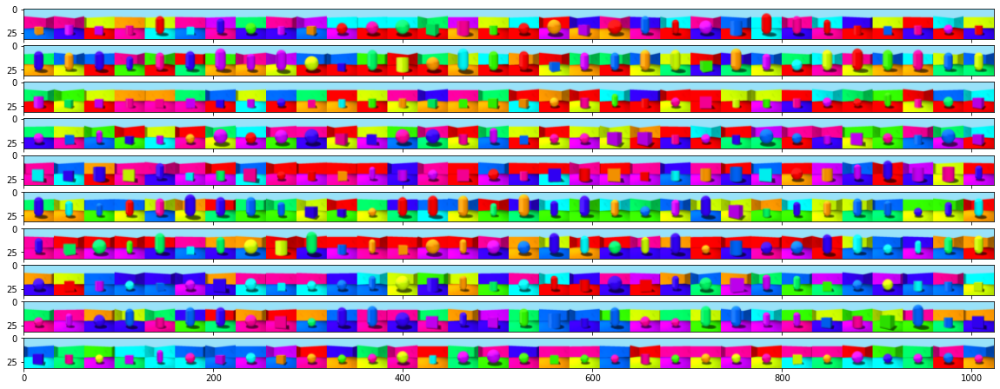

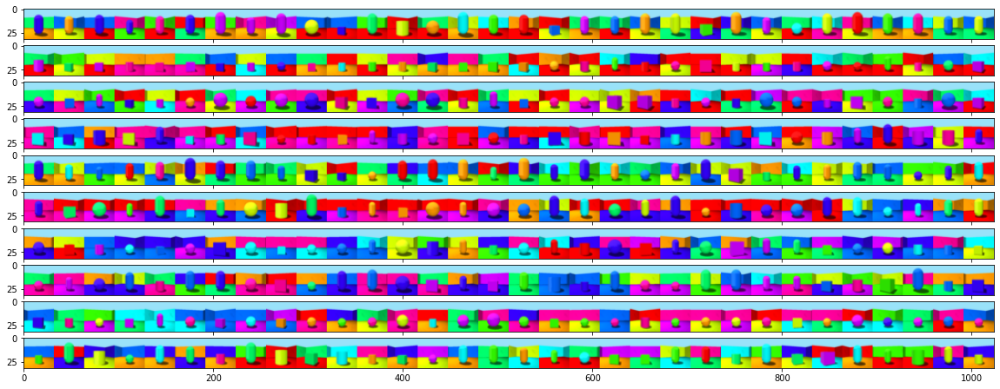

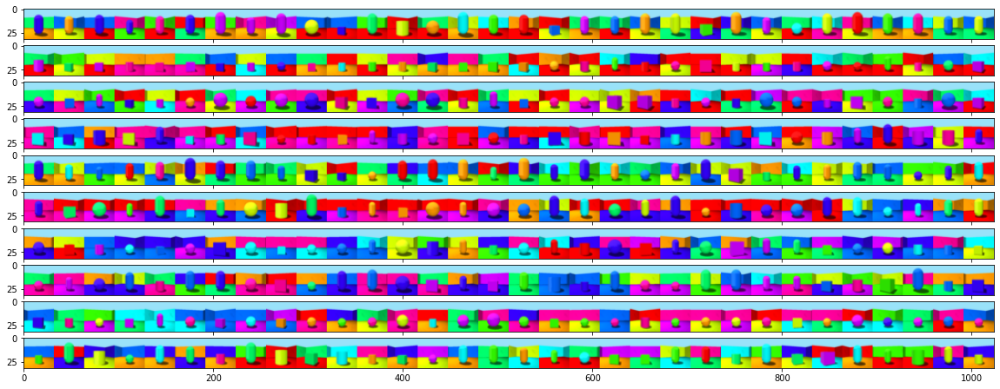

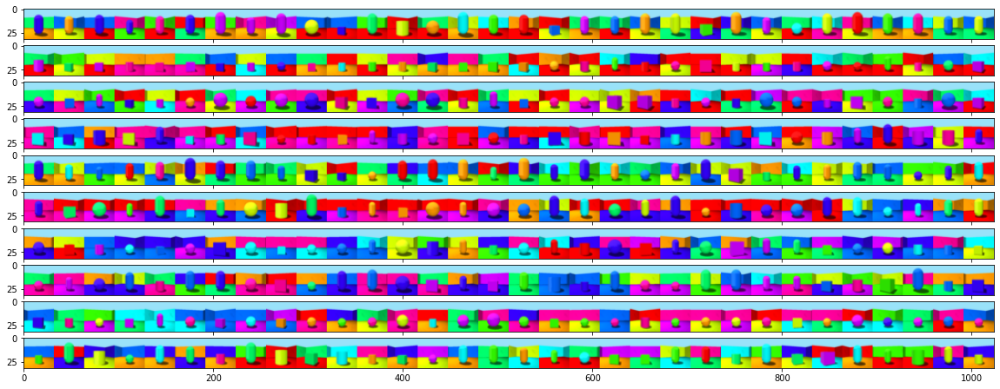

Block 3


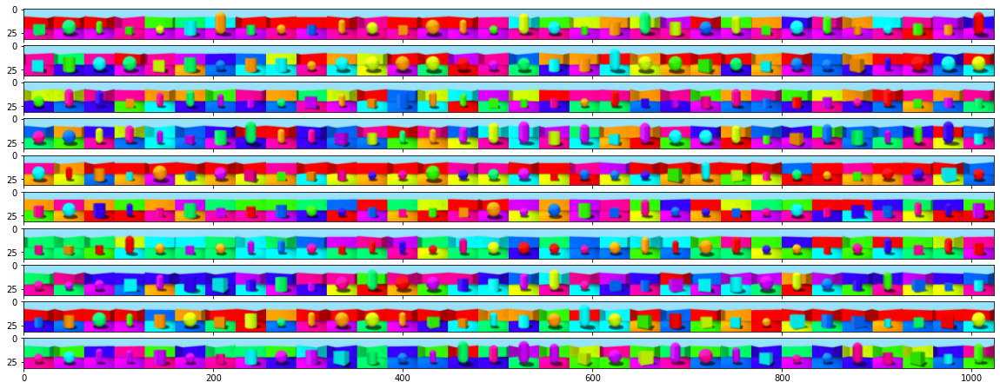

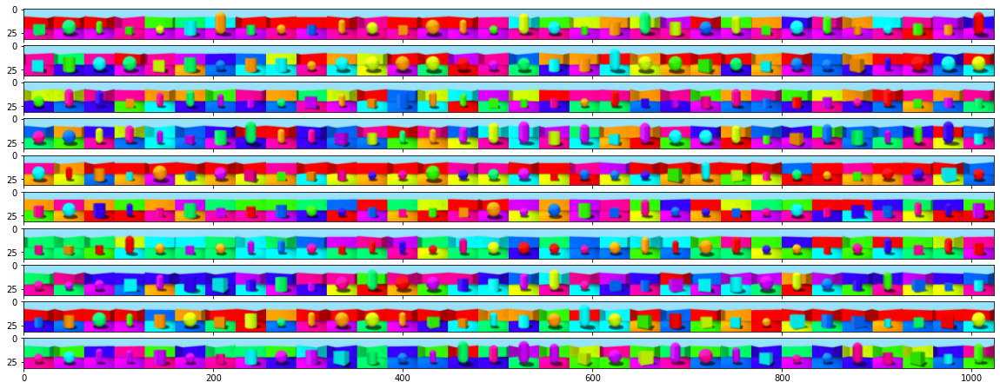

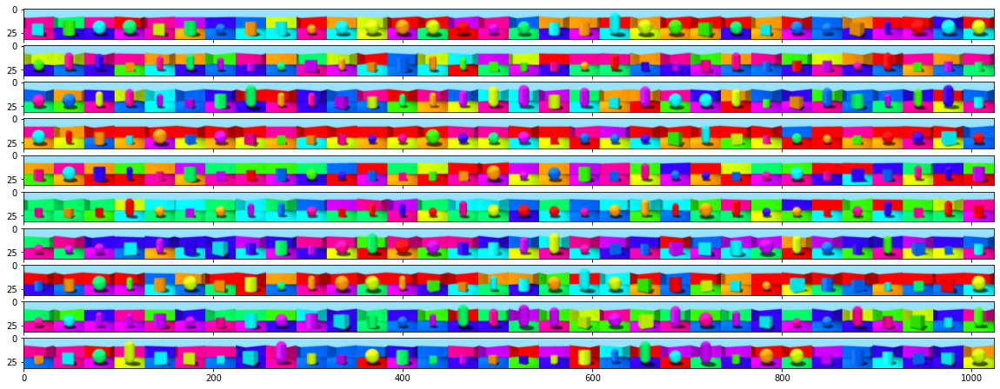

Block 4


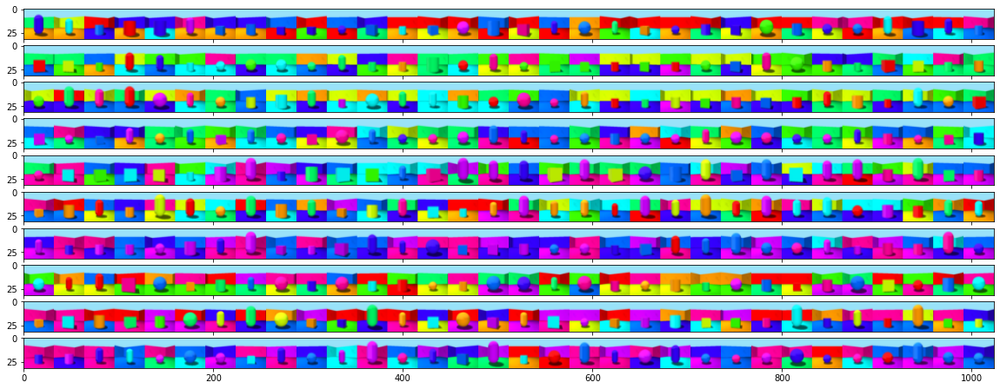

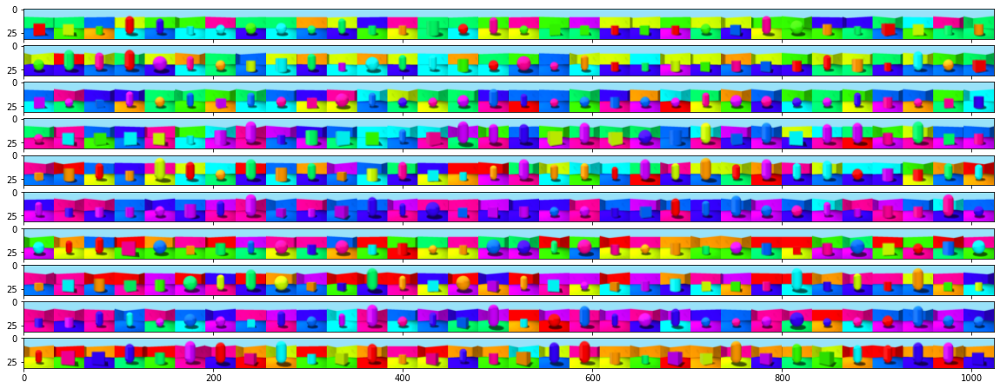

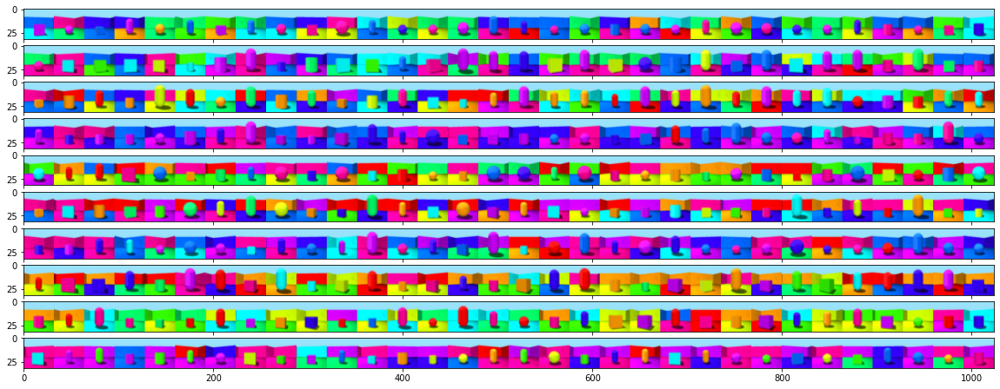

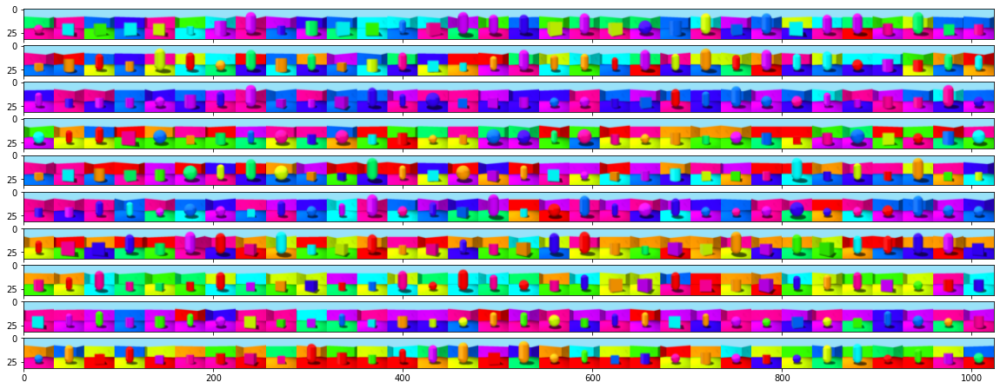

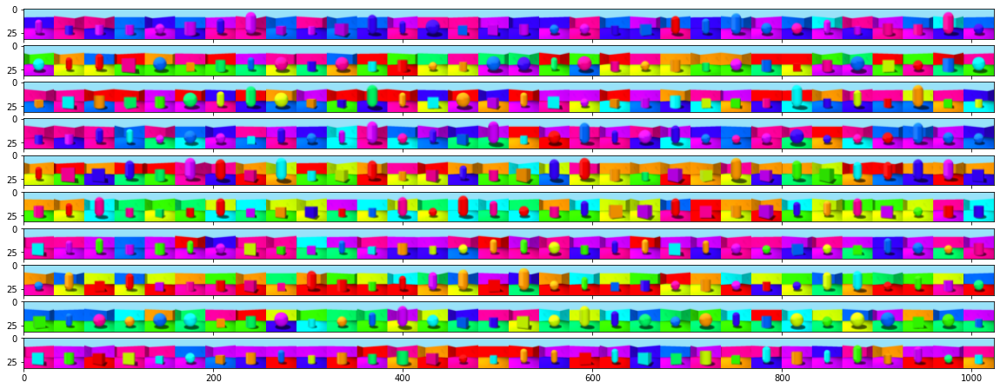

Block 5


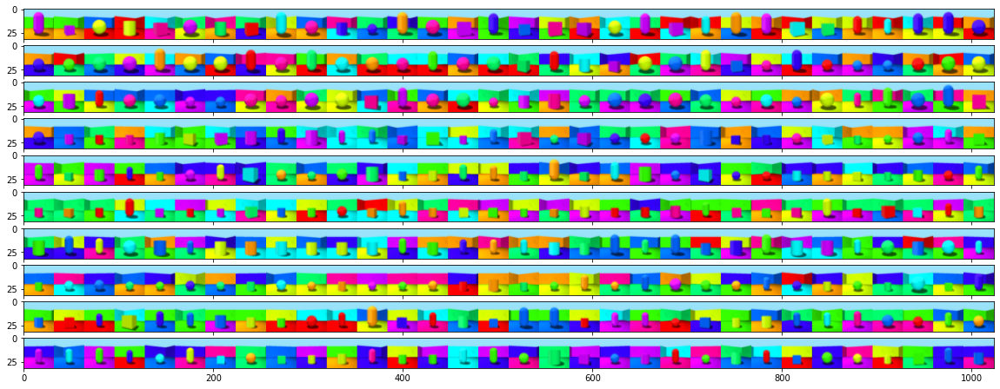

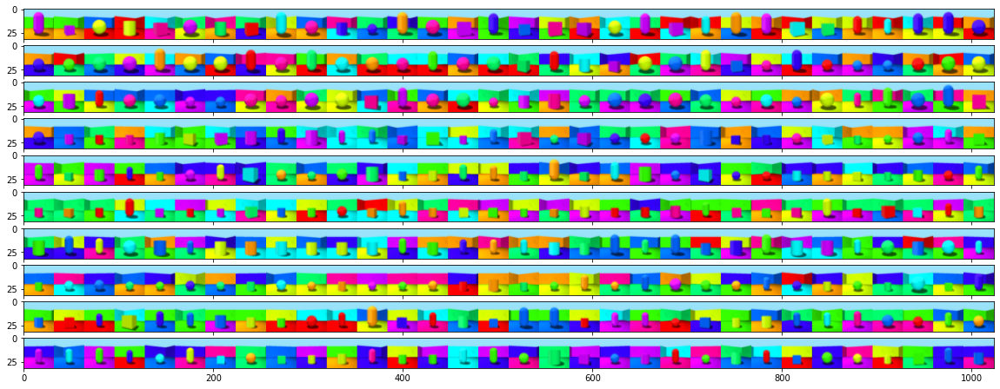

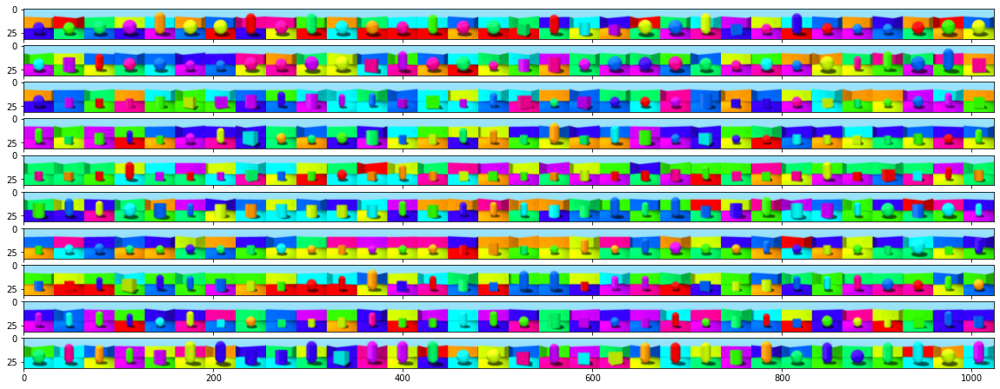

In [17]:
from math import ceil 
for c in range(ncc):
    print("Block {}".format(c))
    for k in range(ceil((blocks == c).sum()/10)):
        fig = plt.figure(figsize=(20., 20.))
        grid = ImageGrid(fig, 111,  # similar to subplot(111)
                         nrows_ncols=(10, 1),  # creates 2x2 grid of axes
                         axes_pad=0.1,  # pad between axes in inch.
                        )
        j = 0
        for i, im_lst in enumerate(img_examples_pos[k*10:-1]):
            if blocks[k*10+i] == c:
                im = np.concatenate(im_lst.transpose(0, 2, 3, 1), axis=1)
                grid[j].imshow(im[:, :1024])
                j+=1
                if j>9:
                    break
                #print(im)

        plt.show()        
        fig.savefig(os.path.join(MODEL_DIR, "visualizations","block_{}_pos_img_examples_{}.png".format(c, k)))

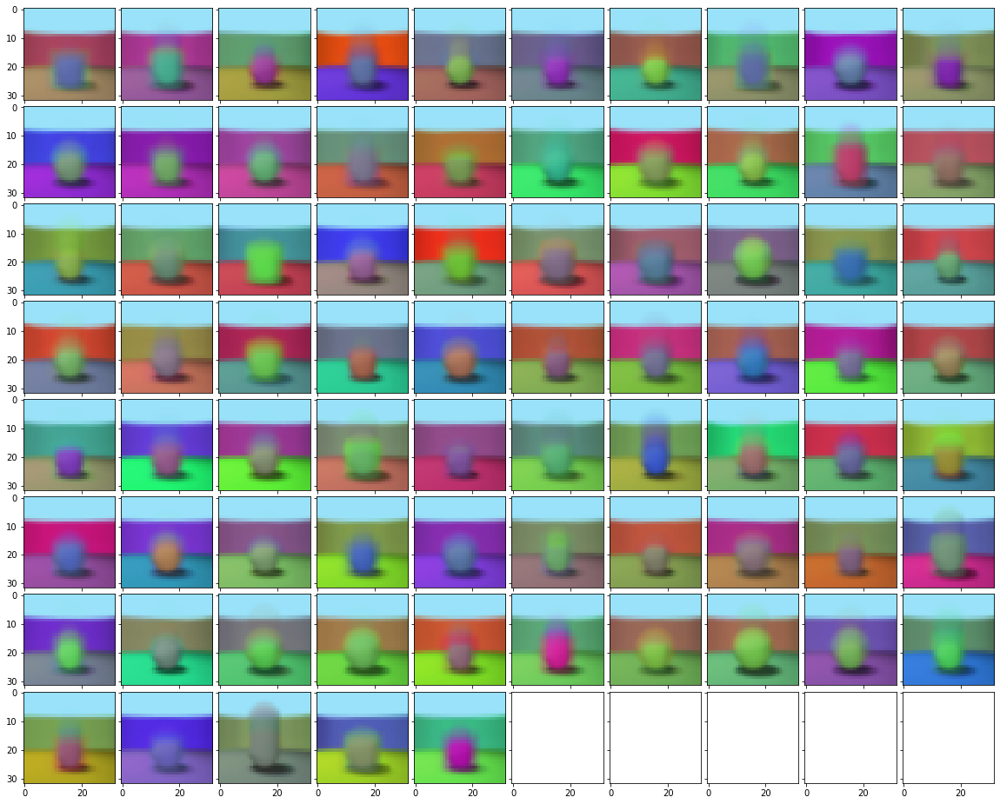

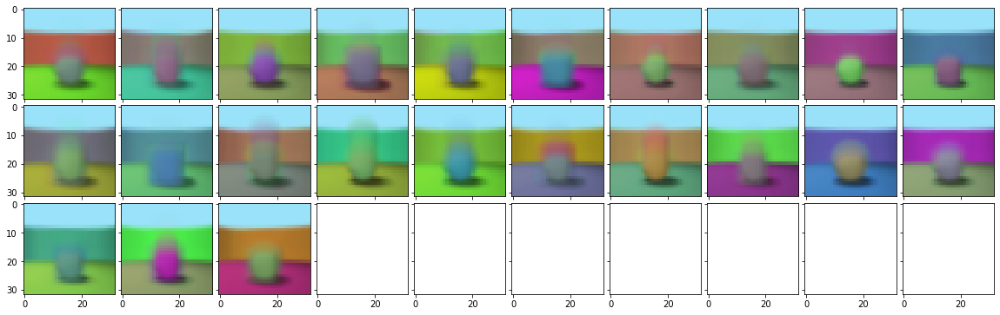

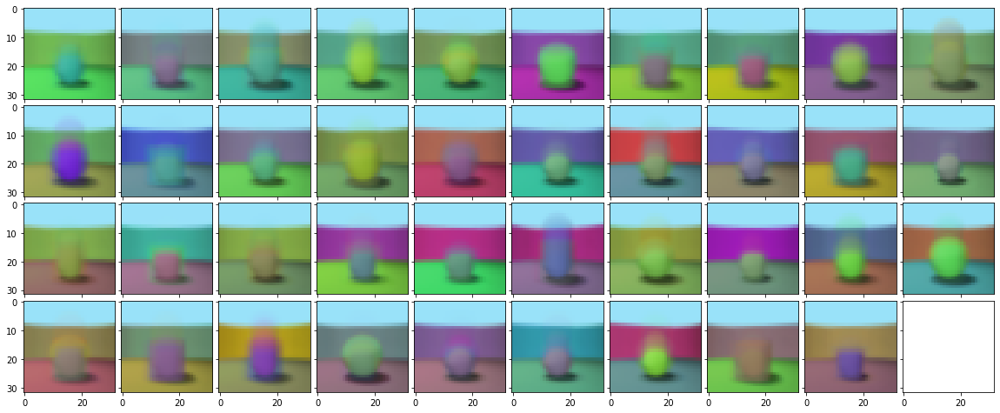

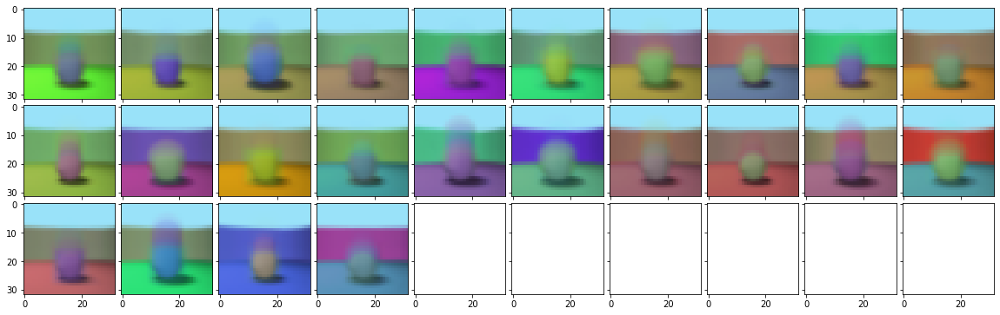

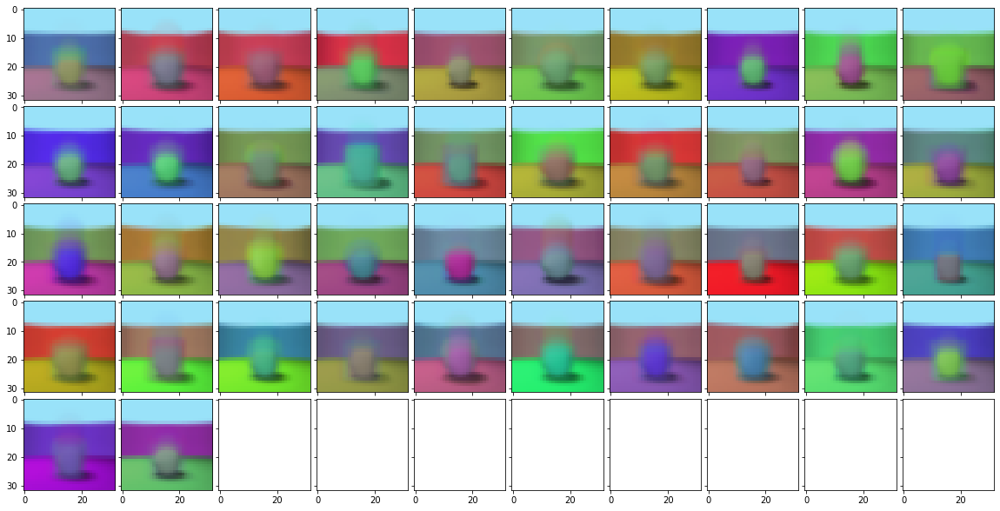

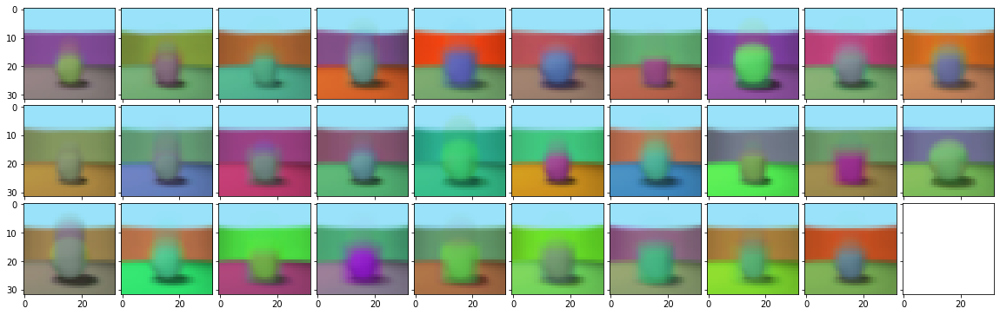

In [18]:
for c in range(ncc):
    fig = plt.figure(figsize=(20., 20.))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(int(np.ceil((blocks==c).sum()/10)), 10),  # creates 2x2 grid of axes
                     axes_pad=0.1,  # pad between axes in inch.
                    )
                     
    for ax, im in zip(grid, weighted_images_neg_norm[blocks==c]):
        ax.imshow(im.transpose(1, 2, 0))
    plt.show()
    fig.savefig(os.path.join(MODEL_DIR, "visualizations","block_{}_neg_img_avg.png".format(c)))

In [19]:
n_classes = 8
def target_vec_to_class(tpl):
    latents, labels = tpl      
    return labels.long()

In [20]:
for c in range(ncc):
    layer.turn_input_neurons_off(blocks==c)
    
    train_running_correct = 0
    for i, data in enumerate(testloader):
        data, target = data[0], data[1]
        data = data.cuda()
        target = target_vec_to_class(target)
        output = vgg16(data)

        _, preds = torch.max(output.data, 1)
        train_running_correct += (preds.cpu() == target).sum().item()

    train_accuracy = 100. * train_running_correct/len(testloader.dataset)
    print("Block {}, accuracy {}".format(c, train_accuracy))
    layer.turn_all_input_neurons_on()
    

Block 0, accuracy 33.85194444444444
Block 1, accuracy 29.038333333333334
Block 2, accuracy 30.52138888888889
Block 3, accuracy 23.74888888888889
Block 4, accuracy 33.859722222222224
Block 5, accuracy 35.397777777777776
